# PROJECT INTRODUCTION


*   In this project, instead of analysing indiviual stocks, we will create a function to perform porfolio analysis such as calculating a portfolio return, rick and Sharpe ratio
*   A portfolio is a collection of financial investments such as stocks, fixed income securities, cash, mutual funds and ETFs.
*   Let's say you have $ 1M dollars to invest, how can you allocate these assets among selected set of securities?






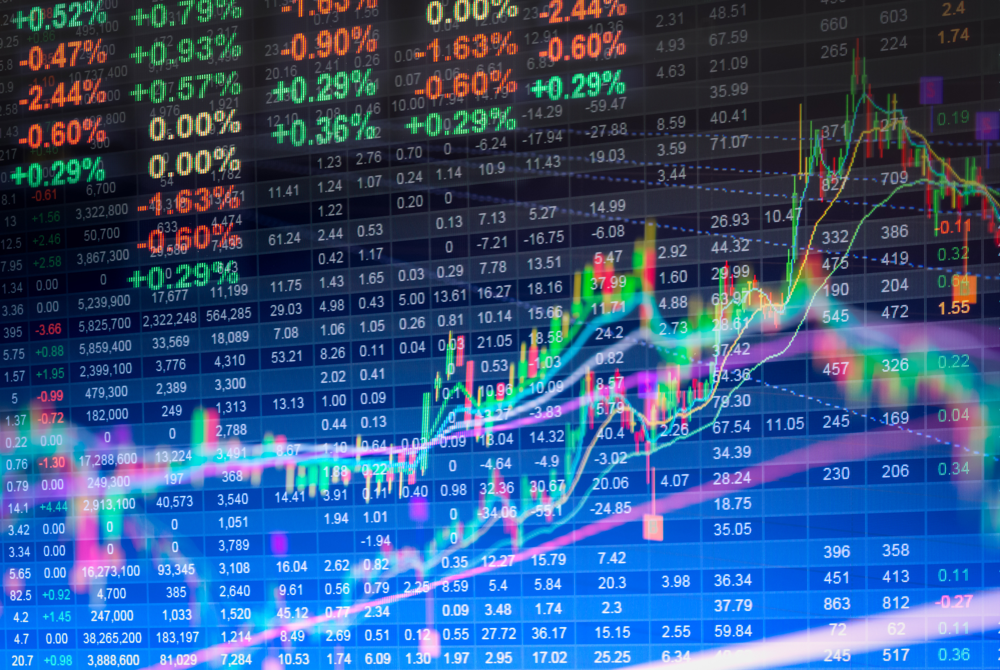

#IMPORT LIBRARIES AND DATASETS AND PERFORM DATA VISUALIZATION

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

!pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 1.5 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0


In [ ]:
!pip install scipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#import libraries
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go
import yfinance as yf

In [ ]:

stocks = ["BA","AAPL","T","MGM","IBM", "MSFT","AMZN","TSLA","SPY","WMT","GOOG"]

In [ ]:
data = yf.download(stocks, start = "2012-01-01", end = "2022-12-02")

[*********************100%***********************]  11 of 11 completed


In [ ]:

stocks_df = data.loc[:,"Close"].copy()
stocks_df.reset_index(inplace = True)

In [35]:
stocks_df

,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT
0,2012-01-03,14.686786,8.951500,74.220001,16.573130,178.107071,11.110000,26.770000,127.500000,22.945620,1.872000,60.330002
1,2012-01-04,14.765714,8.875500,74.330002,16.644611,177.380493,11.040000,27.400000,127.699997,22.983383,1.847333,59.709999
2,2012-01-05,14.929643,8.880500,73.529999,16.413727,176.539200,11.130000,27.680000,128.039993,22.960726,1.808000,59.419998
3,2012-01-06,15.085714,9.130500,73.980003,16.189817,174.512421,11.130000,28.110001,127.709999,22.416918,1.794000,59.000000
4,2012-01-09,15.061786,8.928000,74.529999,15.503389,173.604202,11.320000,27.740000,128.020004,22.401814,1.816667,59.180000
...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,148.110001,93.410004,178.360001,97.599998,148.369995,35.730000,247.490005,402.329987,19.120001,182.860001,153.070007
2744,2022-11-28,144.220001,93.949997,171.830002,96.250000,146.179993,34.919998,241.759995,395.910004,18.820000,182.919998,153.509995
2745,2022-11-29,141.169998,92.419998,175.320007,95.440002,146.490005,35.860001,240.330002,395.230011,19.010000,180.830002,152.970001
2746,2022-11-30,148.029999,96.540001,178.880005,101.449997,148.899994,36.860001,255.139999,407.679993,19.280001,194.699997,152.419998


In [ ]:
stocks_df = stocks_df.sort_values(by = ['Date'])
stocks_df

,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT
0,2012-01-03,14.686786,8.951500,74.220001,16.573130,178.107071,11.110000,26.770000,127.500000,22.945620,1.872000,60.330002
1,2012-01-04,14.765714,8.875500,74.330002,16.644611,177.380493,11.040000,27.400000,127.699997,22.983383,1.847333,59.709999
2,2012-01-05,14.929643,8.880500,73.529999,16.413727,176.539200,11.130000,27.680000,128.039993,22.960726,1.808000,59.419998
3,2012-01-06,15.085714,9.130500,73.980003,16.189817,174.512421,11.130000,28.110001,127.709999,22.416918,1.794000,59.000000
4,2012-01-09,15.061786,8.928000,74.529999,15.503389,173.604202,11.320000,27.740000,128.020004,22.401814,1.816667,59.180000
...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,148.110001,93.410004,178.360001,97.599998,148.369995,35.730000,247.490005,402.329987,19.120001,182.860001,153.070007
2744,2022-11-28,144.220001,93.949997,171.830002,96.250000,146.179993,34.919998,241.759995,395.910004,18.820000,182.919998,153.509995
2745,2022-11-29,141.169998,92.419998,175.320007,95.440002,146.490005,35.860001,240.330002,395.230011,19.010000,180.830002,152.970001
2746,2022-11-30,148.029999,96.540001,178.880005,101.449997,148.899994,36.860001,255.139999,407.679993,19.280001,194.699997,152.419998


In [ ]:
def normalize(df):
  x = df.copy()
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [ ]:
#visualize data
def interactive_plot(df, title):
  fig = px.line(title = title)

  for i in df.columns[1: ]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i)

  fig.show()

In [ ]:
#plot raw data
interactive_plot(stocks_df, 'Price')

In [ ]:
#normalize
interactive_plot(normalize(stocks_df), "Normalize Prices")

# CONCEPT OF ASSET ALLOCATION
 

*   Asset allocation is an investment strategy that is used to allocate client's assets based on their risk tolerance, target returns and investment time span.
*   The goal of portfolio managers is to maximize retirns and reduce risk.



**What is common advice that financial advisors generally give to retired seniors when it comes to asset allocation?**

The conventional wisdom is to subtract client's age from 100 to calculate the % of portfolio that would be allocate to stocks.

ex: if you are 30 years old, you would have 70% allocated to stocks.


#PERFORM RANDOM ASSET ALLOCATION AND CALCULATE PORTFOLIO DAILY RETURN

In [ ]:
weights = np.array(np.random.random(11))
weights

array([0.64612822, 0.09360111, 0.82509079, 0.89167826, 0.17190416,
       0.11957927, 0.13063011, 0.58426178, 0.57816099, 0.89052659,
       0.28692997])

In [ ]:
#let's create random portfolio weights
#portfolio weights must sum to 1
#set random seed
np.random.seed(101)

#create random weights for the stocks and normalize them
weights = np.array(np.random.random(11))

weights = weights/np.sum(weights)
print(weights)

[0.09436203 0.10427865 0.00520312 0.03134232 0.12522134 0.15237879
 0.05609224 0.1632908  0.13184842 0.03470773 0.10127455]


In [ ]:
#normalize the stock values
df_portfolio = normalize(stocks_df)
df_portfolio

,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT
0,2012-01-03,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-04,1.005374,0.991510,1.001482,1.004313,0.995921,0.993699,1.023534,1.001569,1.001646,0.986823,0.989723
2,2012-01-05,1.016536,0.992068,0.990703,0.990382,0.991197,1.001800,1.033993,1.004235,1.000658,0.965812,0.984916
3,2012-01-06,1.027162,1.019997,0.996766,0.976871,0.979817,1.001800,1.050056,1.001647,0.976958,0.958333,0.977955
4,2012-01-09,1.025533,0.997375,1.004177,0.935453,0.974718,1.018902,1.036235,1.004078,0.976300,0.970442,0.980938
...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,10.084576,10.435123,2.403126,5.889051,0.833038,3.216022,9.245050,3.155529,0.833275,97.681625,2.537212
2744,2022-11-28,9.819712,10.495447,2.315144,5.807593,0.820742,3.143114,9.031004,3.105176,0.820200,97.713675,2.544505
2745,2022-11-29,9.612042,10.324526,2.362167,5.758719,0.822483,3.227723,8.977587,3.099843,0.828481,96.597224,2.535554
2746,2022-11-30,10.079128,10.784785,2.410132,6.121354,0.836014,3.317732,9.530818,3.197490,0.840248,104.006410,2.526438


In [ ]:
df_portfolio.columns[1:]

Index(['AAPL', 'AMZN', 'BA', 'GOOG', 'IBM', 'MGM', 'MSFT', 'SPY', 'T', 'TSLA',
       'WMT'],
      dtype='object')

In [36]:
#note that enumerate returns the value and a counter as well
for counter, stock in enumerate(df_portfolio.columns[1: ]):
  df_portfolio[stock] = df_portfolio[stock] * weights[counter]
  df_portfolio[stock] = df_portfolio[stock] * 1000000

df_portfolio

,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT
0,2012-01-03,94362.029694,1.042787e+05,5203.123440,31342.321125,125221.337599,152378.794777,56092.239564,163290.797915,131848.420304,3.470773e+04,101274.553427
1,2012-01-04,94869.138999,1.033933e+05,5210.834930,31477.503953,124710.504209,151418.716517,57412.301695,163546.936435,132065.414681,3.425039e+04,100233.769416
2,2012-01-05,95922.376387,1.034515e+05,5154.751468,31040.865978,124119.017997,152653.110325,57998.998196,163982.373873,131935.222438,3.352114e+04,99746.951708
3,2012-01-06,96925.130781,1.063639e+05,5186.298616,30617.419123,122694.054923,152653.110325,58899.994823,163559.746292,128810.433269,3.326158e+04,99041.910672
4,2012-01-09,96771.390180,1.040049e+05,5224.855528,29319.278733,122055.515868,155259.042635,58124.717447,163956.773700,128723.642094,3.368183e+04,99344.072946
...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,951601.021693,1.088161e+06,12503.760237,184576.513780,104314.158623,490053.504578,518575.586122,515268.898295,109865.933135,3.390308e+06,256955.016813
2744,2022-11-28,926607.926167,1.094451e+06,12045.980808,182023.460339,102774.438535,478943.960308,506569.267726,507046.748240,108142.088772,3.391420e+06,257693.612936
2745,2022-11-29,907011.774603,1.076628e+06,12290.644364,180491.631160,102992.398549,491836.529483,503572.947578,506175.873365,109233.855772,3.352671e+06,256787.138922
2746,2022-11-30,951087.013025,1.124623e+06,12540.214647,191857.449308,104686.783673,505551.992983,534604.920562,522120.716064,110785.312411,3.609827e+06,255863.861750


In [37]:
#let's create an additional column that contains the sum of all $ values in the portfolio
df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
df_portfolio

<ipython-input-37-cf424877b35a>:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT,portfolio daily worth in $
0,2012-01-03,94362.029694,1.042787e+05,5203.123440,31342.321125,125221.337599,152378.794777,56092.239564,163290.797915,131848.420304,3.470773e+04,101274.553427,1.000000e+06
1,2012-01-04,94869.138999,1.033933e+05,5210.834930,31477.503953,124710.504209,151418.716517,57412.301695,163546.936435,132065.414681,3.425039e+04,100233.769416,9.985888e+05
2,2012-01-05,95922.376387,1.034515e+05,5154.751468,31040.865978,124119.017997,152653.110325,57998.998196,163982.373873,131935.222438,3.352114e+04,99746.951708,9.995264e+05
3,2012-01-06,96925.130781,1.063639e+05,5186.298616,30617.419123,122694.054923,152653.110325,58899.994823,163559.746292,128810.433269,3.326158e+04,99041.910672,9.980135e+05
4,2012-01-09,96771.390180,1.040049e+05,5224.855528,29319.278733,122055.515868,155259.042635,58124.717447,163956.773700,128723.642094,3.368183e+04,99344.072946,9.964660e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,951601.021693,1.088161e+06,12503.760237,184576.513780,104314.158623,490053.504578,518575.586122,515268.898295,109865.933135,3.390308e+06,256955.016813,7.622183e+06
2744,2022-11-28,926607.926167,1.094451e+06,12045.980808,182023.460339,102774.438535,478943.960308,506569.267726,507046.748240,108142.088772,3.391420e+06,257693.612936,7.567719e+06
2745,2022-11-29,907011.774603,1.076628e+06,12290.644364,180491.631160,102992.398549,491836.529483,503572.947578,506175.873365,109233.855772,3.352671e+06,256787.138922,7.499691e+06
2746,2022-11-30,951087.013025,1.124623e+06,12540.214647,191857.449308,104686.783673,505551.992983,534604.920562,522120.716064,110785.312411,3.609827e+06,255863.861750,7.923548e+06


In [39]:
#define a new column in the dataframe and set it to zeros
df_portfolio['portfolio daily % return'] = 0.0000
for i in range(1, len(stocks_df)):
  df_portfolio['portfolio daily % return'][i] = ((df_portfolio['portfolio daily worth in $'][i] -df_portfolio['portfolio daily worth in $'][i-1] )/ df_portfolio['portfolio daily worth in $'][i-1])*100

df_portfolio

,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT,portfolio daily worth in $,portfolio daily % return
0,2012-01-03,94362.029694,1.042787e+05,5203.123440,31342.321125,125221.337599,152378.794777,56092.239564,163290.797915,131848.420304,3.470773e+04,101274.553427,1.000000e+06,0.000000
1,2012-01-04,94869.138999,1.033933e+05,5210.834930,31477.503953,124710.504209,151418.716517,57412.301695,163546.936435,132065.414681,3.425039e+04,100233.769416,9.985888e+05,-0.141118
2,2012-01-05,95922.376387,1.034515e+05,5154.751468,31040.865978,124119.017997,152653.110325,57998.998196,163982.373873,131935.222438,3.352114e+04,99746.951708,9.995264e+05,0.093887
3,2012-01-06,96925.130781,1.063639e+05,5186.298616,30617.419123,122694.054923,152653.110325,58899.994823,163559.746292,128810.433269,3.326158e+04,99041.910672,9.980135e+05,-0.151353
4,2012-01-09,96771.390180,1.040049e+05,5224.855528,29319.278733,122055.515868,155259.042635,58124.717447,163956.773700,128723.642094,3.368183e+04,99344.072946,9.964660e+05,-0.155061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,951601.021693,1.088161e+06,12503.760237,184576.513780,104314.158623,490053.504578,518575.586122,515268.898295,109865.933135,3.390308e+06,256955.016813,7.622183e+06,-0.484834
2744,2022-11-28,926607.926167,1.094451e+06,12045.980808,182023.460339,102774.438535,478943.960308,506569.267726,507046.748240,108142.088772,3.391420e+06,257693.612936,7.567719e+06,-0.714546
2745,2022-11-29,907011.774603,1.076628e+06,12290.644364,180491.631160,102992.398549,491836.529483,503572.947578,506175.873365,109233.855772,3.352671e+06,256787.138922,7.499691e+06,-0.898918
2746,2022-11-30,951087.013025,1.124623e+06,12540.214647,191857.449308,104686.783673,505551.992983,534604.920562,522120.716064,110785.312411,3.609827e+06,255863.861750,7.923548e+06,5.651654


# PORTFOLIO ALLOCATION - DAILY RETURN/WORTH CALCULATION (FUNCTION)

In [43]:
#let's assume we have $1,000 to be invested and we will allocate this fund based on the weights of the stocks
#we will create a function that takes in the stock prices along with the weights and return:
# 1. Daily value of each individual security in $ over the specified time period
# 2. Overall daily worth of the entire portfolio
# 3. Daily return

def portfolio_allocation(df, weights):
  df_portfolio = df.copy()
  df_portfolio = normalize(df_portfolio)

  for counter, stock in enumerate(df_portfolio.columns[1: ]):
    df_portfolio[stock] = df_portfolio[stock] * weights[counter]
    df_portfolio[stock] = df_portfolio[stock] * 1000000
  
  df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
  df_portfolio['portfolio daily % return'] = 0.0000
  for i in range(1, len(stocks_df)):
    df_portfolio['portfolio daily % return'][i] = ((df_portfolio['portfolio daily worth in $'][i] -df_portfolio['portfolio daily worth in $'][i-1] )/ df_portfolio['portfolio daily worth in $'][i-1])*100

  df_portfolio['portfolio daily % return'][0] = 0
  return df_portfolio

In [44]:
df_portfolio = portfolio_allocation(stocks_df, weights)
df_portfolio

<ipython-input-43-fa220a51c3e5>:15: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT,portfolio daily worth in $,portfolio daily % return
0,2012-01-03,94362.029694,1.042787e+05,5203.123440,31342.321125,125221.337599,152378.794777,56092.239564,163290.797915,131848.420304,3.470773e+04,101274.553427,1.000000e+06,0.000000
1,2012-01-04,94869.138999,1.033933e+05,5210.834930,31477.503953,124710.504209,151418.716517,57412.301695,163546.936435,132065.414681,3.425039e+04,100233.769416,9.985888e+05,-0.141118
2,2012-01-05,95922.376387,1.034515e+05,5154.751468,31040.865978,124119.017997,152653.110325,57998.998196,163982.373873,131935.222438,3.352114e+04,99746.951708,9.995264e+05,0.093887
3,2012-01-06,96925.130781,1.063639e+05,5186.298616,30617.419123,122694.054923,152653.110325,58899.994823,163559.746292,128810.433269,3.326158e+04,99041.910672,9.980135e+05,-0.151353
4,2012-01-09,96771.390180,1.040049e+05,5224.855528,29319.278733,122055.515868,155259.042635,58124.717447,163956.773700,128723.642094,3.368183e+04,99344.072946,9.964660e+05,-0.155061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,951601.021693,1.088161e+06,12503.760237,184576.513780,104314.158623,490053.504578,518575.586122,515268.898295,109865.933135,3.390308e+06,256955.016813,7.622183e+06,-0.484834
2744,2022-11-28,926607.926167,1.094451e+06,12045.980808,182023.460339,102774.438535,478943.960308,506569.267726,507046.748240,108142.088772,3.391420e+06,257693.612936,7.567719e+06,-0.714546
2745,2022-11-29,907011.774603,1.076628e+06,12290.644364,180491.631160,102992.398549,491836.529483,503572.947578,506175.873365,109233.855772,3.352671e+06,256787.138922,7.499691e+06,-0.898918
2746,2022-11-30,951087.013025,1.124623e+06,12540.214647,191857.449308,104686.783673,505551.992983,534604.920562,522120.716064,110785.312411,3.609827e+06,255863.861750,7.923548e+06,5.651654


# PERFORM DATA VISUALIZATION

In [45]:
#plot the portfolio daily return
fig = px.line(x = df_portfolio.Date , y = df_portfolio['portfolio daily % return'] , title = 'Portfolio Daily % Return')

fig.show()

In [46]:
#plot all stocks
interactive_plot(df_portfolio.drop(['portfolio daily worth in $', 'portfolio daily % return'], axis = 1), 'Portfolio Individual stocks worth in $ over time')

Tesla has been brought the most profit in the portfolio, in peak time like Nov-2021 Tesla shares worth $7M!!!! but tesla stock is quite volatile.

In [47]:
#print out histogram of daily
fig = px.histogram(df_portfolio, x = 'portfolio daily % return')
fig.show()

On average, most of returns were around zero. We also find that the standard deviation we are talking about +- 5, like we barely lost again like 10% one day. we also barely made like 8-10%. But in general, the bulk of data is arounf -5 - +5%

In [48]:
# plot the portfolio overall daily worth vs time
fig = px.line(x = df_portfolio.Date , y =  df_portfolio['portfolio daily worth in $'], title = 'Portfolio Overall Value in $')
fig.show()

During your peak time, your $1M portfolio would worth $13M! 

# UNDERSTAND PORTFOLIO STATISTICAL METRICS

**Daily and Cummulative Returns**


*   Stock daily return is a calculation of how much investors have gain or lost per day
*   Cummulative return is a measure of the aggregate amount that the stock gained or lost over a period of time


**Standard Deviation**


*   is a measurement of the dispersion away from the mean
*   The more spread data is, the higher the standard deviation
*   Volatile stocks have high standard deviation and therefore standard deviation represent the risk associated with the security


In general investors dont like high standard deviation .However, there is massive return compare to the amount of risk, for ex in start up companies.


**Sharpe Ratio**

*   Sharpe ratio is used by investors to calculate the return of an investment compared to its risk
*   Sharpe is simply a calculation of the average return earned in excess of the risk free rate
*   As Sharpe ratio increases, risk-adjusted return increases and security becomes more desired by investors













In [51]:
#cummulative return of the portfolio
cummulative_return = ( (df_portfolio['portfolio daily worth in $'][-1:] - df_portfolio['portfolio daily worth in $'][0] )/ df_portfolio['portfolio daily worth in $'][0] )*100
print(f'Cummulative Return of the portfolio in %:  {cummulative_return.values[0]}')

Cummulative Return of the portfolio in %:  691.8249202260553


In [52]:
#calculate standard deviation
print(f"Standard deviation of the portfolio is {df_portfolio['portfolio daily % return'].std()}")

Standard deviation of the portfolio is 1.6390717714191756


In [53]:
#calculate the average daily return
print(f"Average daily return of the portfolio is {df_portfolio['portfolio daily % return'].mean()}")

Average daily return of the portfolio is 0.0888099276621474


In [54]:
#Portfolio sharpe ratio
sharpe_ratio = df_portfolio['portfolio daily % return'].mean() / df_portfolio['portfolio daily % return'].std() * np.sqrt(252)
print(f"Sharpe of the portfolio is {sharpe_ratio}")

Sharpe of the portfolio is 0.8601294463545016


# CAPITAL ASSETS PRICING MODEL (CAPM)



*   CAPM is one of the most important models in Finance
*   CAPM is model that describes the relationship between the expected return and risk of securities
*   CAPM indicated that the expected return on a security is equal to the risk-free return plus a risk premium

**RISK FREE ASSET**


*   CAPM assumes that there exist a risk free asset with zero standard deviation
*   The risk free asset return is denoted as rf.
*   Investors who are extemely risk averse would orefer to buy the risk free asset to protect their money and earn a low return
*   A risk free asset could be a US Government 10 year Treasury bill. This is technically a risk free asset since it is backed by the US Government
CAPM: Expected return of a security = risk free rate of return + beta between stock and market*(risk premium)


**MARKET PORTFOLIO**
*   Market portfolio includes all securities in the market. A good representation of the market portfolio is SPY500
*   The index is viewed as a gauge of large-cap US Equities.


**BETA**
*   Beta represents the slope of the line regression line (market return vs stock return
*   Beta is a measure of the votality or systematic risk of a security or a portfolio compared to the entire market
*   Beta is used in the CAPM and describes the relationship between systematic risk and expected return for the assets
*   Tech stocks generally have higher betas than S&P500 but they also have excess returns
*   Beta -1, >1, <1











## CALCULATE DAILY RETURNS

In [55]:
#function to calculate daily return
def daily_return(df):
  df_daily_return = df.copy()
  for i in df.columns[1:]:
    for j in range(1, len(df)):
      df_daily_return[i][j] = ((df[i][j] - df[i][j-1]) / df[i][j-1]) *100

    df_daily_return[i][0] = 0
  return df_daily_return

In [56]:
#get the daily return
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return

,Date,AAPL,AMZN,BA,GOOG,IBM,MGM,MSFT,SPY,T,TSLA,WMT
0,2012-01-03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-04,0.537408,-0.849022,0.148209,0.431311,-0.407944,-0.630060,2.353377,0.156860,0.164579,-1.317683,-1.027686
2,2012-01-05,1.110200,0.056336,-1.076286,-1.387143,-0.474287,0.815219,1.021900,0.266246,-0.098582,-2.129177,-0.485682
3,2012-01-06,1.045381,2.815157,0.612001,-1.364159,-1.148062,0.000000,1.553469,-0.257727,-2.368427,-0.774333,-0.706830
4,2012-01-09,-0.158618,-2.217835,0.743438,-4.239875,-0.520432,1.707094,-1.316261,0.242742,-0.067379,1.263486,0.305085
...,...,...,...,...,...,...,...,...,...,...,...,...
2743,2022-11-25,-1.959361,-0.764893,2.007432,-1.234569,-0.255465,-0.418064,-0.036350,-0.022371,0.157154,-0.185588,0.426459
2744,2022-11-28,-2.626426,0.578089,-3.661134,-1.383195,-1.476041,-2.267006,-2.315249,-1.595701,-1.569044,0.032811,0.287442
2745,2022-11-29,-2.114827,-1.628525,2.031080,-0.841556,0.212076,2.691874,-0.591493,-0.171754,1.009567,-1.142574,-0.351764
2746,2022-11-30,4.859390,4.457913,2.030571,6.297144,1.645156,2.788622,6.162359,3.150060,1.420307,7.670185,-0.359550


## CALCULATE BETA FOR A SINGLE STOCK

In [57]:
#Select a stock, just say Apple
stocks_daily_return['AAPL']

0       0.000000
1       0.537408
2       1.110200
3       1.045381
4      -0.158618
          ...   
2743   -1.959361
2744   -2.626426
2745   -2.114827
2746    4.859390
2747    0.189150
Name: AAPL, Length: 2748, dtype: float64

In [58]:
#select market
stocks_daily_return['SPY']

0       0.000000
1       0.156860
2       0.266246
3      -0.257727
4       0.242742
          ...   
2743   -0.022371
2744   -1.595701
2745   -0.171754
2746    3.150060
2747   -0.073584
Name: SPY, Length: 2748, dtype: float64

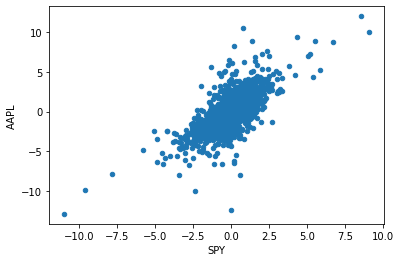

In [59]:
#plot a scatter plot between the selected stock and market
stocks_daily_return.plot(kind = 'scatter', x = 'SPY', y = 'AAPL')

In [68]:
#fit a polynomial between selected stock and market
beta, alpha = np.polyfit(stocks_daily_return['SPY'], stocks_daily_return['AAPL'],1)
print(f"Beta for AAPL stock is {beta} and alpha is {alpha}")

Beta for AAPL stock is 1.1817837647298692 and alpha is 0.04418077882417449


As we know beta is a measure of volatility or systematic risk of a security or portfolio compares to entire market which is SPY. Beta secribes the relationship between systematic risk and expected return for assets. Since Beta of Apple is > 1, it suggests that the price of security is more volatile then the market, which mean 18% more of price of Apple is excess return of the market

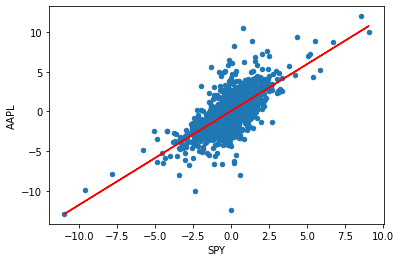

In [62]:
stocks_daily_return.plot(kind = 'scatter', x = 'SPY', y = 'AAPL')
#straight line equation with alpha and beta
plt.plot(stocks_daily_return['SPY'], beta * stocks_daily_return['SPY'] + alpha, '-', color = 'r')

In [63]:
#let's calculate beta of tsla
stocks_daily_return['TSLA']

0       0.000000
1      -1.317683
2      -2.129177
3      -0.774333
4       1.263486
          ...   
2743   -0.185588
2744    0.032811
2745   -1.142574
2746    7.670185
2747    0.000000
Name: TSLA, Length: 2748, dtype: float64

In [64]:
beta, alpha = np.polyfit(stocks_daily_return['SPY'], stocks_daily_return['TSLA'],1)
print(f"Beta for TSLA stock is {beta} and alpha is {alpha}")

Beta for TSLA stock is 1.4297580582973113 and alpha is 0.16361233153419258


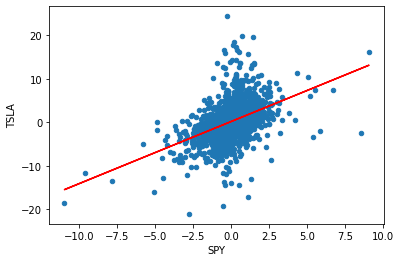

In [65]:
stocks_daily_return.plot(kind = 'scatter', x = 'SPY', y = 'TSLA')
#straight line equation with alpha and beta
plt.plot(stocks_daily_return['SPY'], beta * stocks_daily_return['SPY'] + alpha, '-', color = 'r')

## APPLY CAPM to INDIVIDUAL STOCK

In [69]:
beta

1.1817837647298692

In [67]:
#let's calculate the average daily rate of return for SPY
stocks_daily_return['SPY'].mean()

0.048082231750972614

In [70]:
#let's calculate the annualize rate of return for SPY
#note that out of 365 days/year, stock exchanges are closed for 104 days during weekends days
rm = stocks_daily_return['SPY'].mean() * 252
rm

12.116722401245099

In [71]:
#assume risk free rate is zero
#also can use the yield of 10 years US Gov Bond is risk free rate
rf = 0

#calculate return of AAPL using CAPM
Er_AAPL = rf + (beta *(rm - rf))

In [72]:
Er_AAPL

14.319345815530173

So in order to be compensated for the return above the market which is 12.1%, you would be compensated by 14.3% by investing in Apple throughout years.

In [78]:
#now let's apply CAPM to Wallmart
beta_walmart, alpha_walmart = np.polyfit(stocks_daily_return['SPY'], stocks_daily_return['WMT'],1)
print(f"Beta for Wallmart stock is {beta_walmart} and alpha is {alpha_walmart}")

Beta for Wallmart stock is 0.5253753750647674 and alpha is 0.016823449947530503


Beta for Wallmart suggests that Wallmart is more of a conservative stock or less volatile compare to market

In [79]:
Er_WMT = rf + (beta_walmart *(rm - rf))

In [80]:
Er_WMT

6.365827576109813

So essentially, if you decide to invest in Wallmart, you should be able to expect a return of around 6.36%, which is less than the market (12%)

## CALCULATE BETA FOR ALL STOCKS

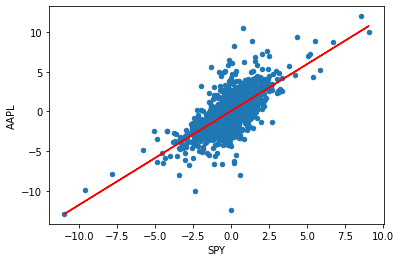

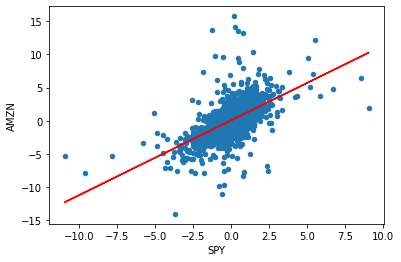

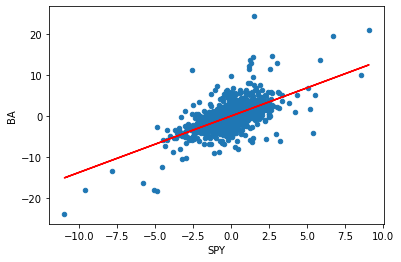

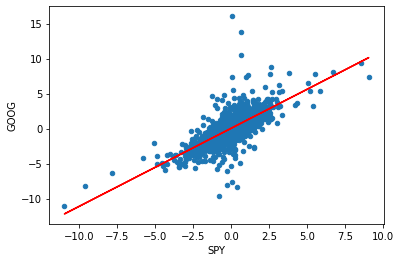

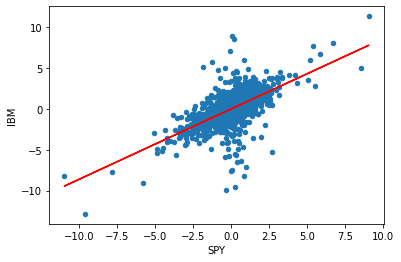

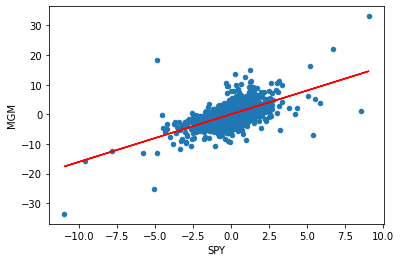

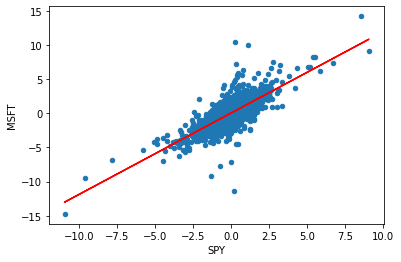

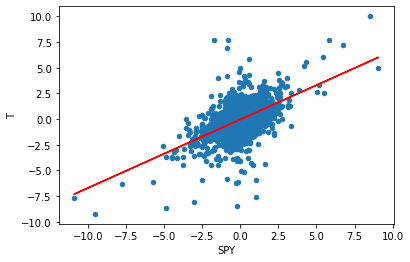

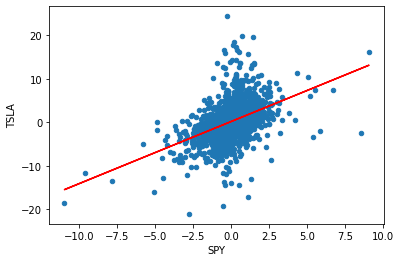

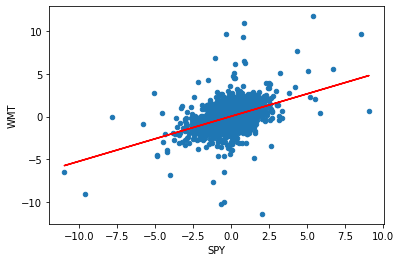

In [82]:
#let's create a placeholder for all betas and alphas
beta = {}
alpha = {}

for i in stocks_daily_return.columns:
  if i != 'Date' and i != 'SPY':
    stocks_daily_return.plot(kind = 'scatter', x= 'SPY', y = i)
    b, a = np.polyfit(stocks_daily_return['SPY'], stocks_daily_return[i], 1)
    plt.plot(stocks_daily_return['SPY'], b*stocks_daily_return['SPY'] + a, '-', color = 'r')

    beta[i] = b
    alpha[i] = a
    plt.show()



In [83]:
beta

{'AAPL': 1.1817837647298692,
 'AMZN': 1.1290078947794344,
 'BA': 1.37564382853638,
 'GOOG': 1.1166355914598358,
 'IBM': 0.8604529489127831,
 'MGM': 1.6071452915766928,
 'MSFT': 1.193201118130072,
 'T': 0.6668706316281384,
 'TSLA': 1.4297580582973113,
 'WMT': 0.5253753750647674}

In [84]:
alpha

{'AAPL': 0.04418077882417449,
 'AMZN': 0.052751812485967005,
 'BA': -0.006719186518580212,
 'GOOG': 0.026306557252311888,
 'IBM': -0.03724167188705789,
 'MGM': 0.005638137157866865,
 'MSFT': 0.03863393207460295,
 'T': -0.02994895820575363,
 'TSLA': 0.16361233153419258,
 'WMT': 0.016823449947530503}

Alpha describes the strategy's ability to beat the market. Alpha indicates the "excess return" or "abnormal rate of return". A positive alpha ex TSLA, AAPL for 0.16 and 0.04 means that the portfolio's return exceeded the benmark of SPY index by 16% and 4% respectively

In [87]:
#using plotly
for i in stocks_daily_return.columns:
  if i != 'Date' and i != 'SPY':
    fig = px.scatter(stocks_daily_return, x = 'SPY', y = i, title = i)
    b, a = np.polyfit(stocks_daily_return['SPY'], stocks_daily_return[i], 1)
    fig.add_scatter(x = stocks_daily_return['SPY'], y = b* stocks_daily_return['SPY'] + a)

    fig.show()

## APPLY CAPM FORMULA TO CALCULATE THE RETURN FOR THE PORTFOLIO

In [88]:
#obtain a list of all stock names
keys = list(beta.keys())
keys


['AAPL', 'AMZN', 'BA', 'GOOG', 'IBM', 'MGM', 'MSFT', 'T', 'TSLA', 'WMT']

In [89]:
#define the expected return
ER = {}

rf = 0
rm = stocks_daily_return['SPY'].mean()* 252

for i in keys:
  ER[i] = rf + (beta[i]* (rm - rf))
  

In [91]:
for i in keys:
  print(f'Expected return based on CAPM for {i} is {ER[i]} %')

Expected return based on CAPM for AAPL is 14.319345815530173 %
Expected return based on CAPM for AMZN is 13.679875249856542 %
Expected return based on CAPM for BA is 16.668294393361325 %
Expected return based on CAPM for GOOG is 13.529963485068963 %
Expected return based on CAPM for IBM is 10.425869521308924 %
Expected return based on CAPM for MGM is 19.4733333565029 %
Expected return based on CAPM for MSFT is 14.457686717237342 %
Expected return based on CAPM for T is 8.080286320981132 %
Expected return based on CAPM for TSLA is 17.32398149333173 %
Expected return based on CAPM for WMT is 6.365827576109813 %


In [92]:
portfolio_weights = 1/10 * np.ones(10)
portfolio_weights

array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])

In [93]:
#assume equal weights in the portfolio
ER_portfolio = sum(list(ER.values()) * portfolio_weights)
ER_portfolio

13.432446392928883

In [94]:
#calculate the portfolio return
print(f"Expected return based on CAPM for the portfolio is {ER_portfolio} %")

Expected return based on CAPM for the portfolio is 13.432446392928883 %


In [95]:
#let's say your portfolio has 50% of Apple and 50% of amazon
ER_portfolio_1 = 0.5 * ER['AAPL'] + 0.5 * ER['AMZN']
ER_portfolio_1

13.999610532693357